# Local Explainability with Visual-TCAV on GoogleNet

This notebook replicates the experiment from `tcav_googlenet_local.ipynb` (which uses Captum's TCAV directly) but uses the **`VisualTCAV_pytorch`** library instead.

**Key differences from the original:**
- Uses `VisualTCAV_pytorch.Model` + `LocalVisualTCAV` instead of Captum's `TCAV` class
- Visual-TCAV provides **spatial concept maps** (heatmaps) showing *where* a concept is detected, not just a scalar score
- Supports both centroid-based CAVs (Visual-TCAV original) and classifier-based CAVs (standard TCAV)

**Test image:** Nautilus (chambered nautilus, ImageNet class 117)
**Concepts:** stripped, spiralled, freckled, braided, chequered (from Broden dataset)
**Layers:** inception4c, inception4d, inception4e

## 1. Setup

In [1]:
import sys, os
import numpy as np
from pathlib import Path
from itertools import combinations

import torch
import torch.nn.functional as F
from PIL import Image
from torchvision import transforms, models

import matplotlib.pyplot as plt

from VisualTCAV_pytorch import Model, LocalVisualTCAV

# Project paths
PROJECT_ROOT = Path(os.path.abspath(''))
sys.path.insert(0, str(PROJECT_ROOT))
os.chdir(PROJECT_ROOT)


DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Project root: {PROJECT_ROOT}')
print(f'Device: {DEVICE}')

# Configuration
METHOD_CAV = "centroid"
CONCEPTS = ['stripped', 'spiralled', 'forest_floor', 'frekeled', 'braided', 'chequered']

LAYERS = [
        'inception3a', 'inception3b','inception4a', 'inception4b', 'inception4c', 'inception4d', 'inception4e',
        'inception5a', 'inception5b']


/home/dlc/VisualTCAV/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Project root: /home/dlc/VisualTCAV
Device: cuda


## 2. Load GoogleNet and wrap with VisualTCAV Model

GoogleNet (GoogLeNet) expects 224x224 RGB images with ImageNet normalization.
We pass the `nn.Module` directly and provide the ImageNet class labels.

In [2]:
weights = models.GoogLeNet_Weights.IMAGENET1K_V1


nn_model = models.googlenet(weights=weights)
nn_model.to(DEVICE).eval()


imagenet_labels = weights.meta['categories']
print(f'Number of classes: {len(imagenet_labels)}')
print(f'Class 993: {imagenet_labels[993]}')

pretrained_transforms = weights.transforms()
imagenet_mean = np.array(pretrained_transforms.mean)
imagenet_std = np.array(pretrained_transforms.std)

def preprocess_imagenet(imgs):
    # VisualTCAV loads images as numpy [N, H, W, C] uint8
    imgs = imgs.astype(np.float32) / 255.0
    imgs = (imgs - imagenet_mean) / imagenet_std
    return imgs.astype(np.float32)

vtcav_model = Model(
    model_name='GoogleNet',
    graph_path_filename=nn_model,
    label_path_filename=imagenet_labels,
    preprocessing_function=preprocess_imagenet,
    binary_classification=False,
    max_examples=500,
    image_shape=[224, 224, 3],
)

print(f'Model: {vtcav_model.model_name}')

Number of classes: 1000
Class 993: gyromitra
Model: GoogleNet


## 3. Directory Structure & Test Image

Concept images are in `data/concepts/` and the test image (Nautilus) is in `data/example_images/`.

Concepts dir: /home/dlc/VisualTCAV/data/concepts
Test images dir: /home/dlc/VisualTCAV/data/example_images


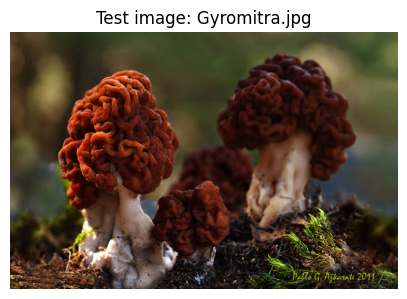

In [3]:
CONCEPTS_DIR = str(PROJECT_ROOT / 'data' / 'concepts')
TEST_IMAGES_DIR = str(PROJECT_ROOT / 'data' / 'example_images')

print(f'Concepts dir: {CONCEPTS_DIR}')
print(f'Test images dir: {TEST_IMAGES_DIR}')

# Show test image
img = Image.open(os.path.join(TEST_IMAGES_DIR, 'Gyromitra.jpg')).convert('RGB')
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.title('Test image: Gyromitra.jpg')
plt.axis('off')
plt.show()

## 4. Visualize Concept Images

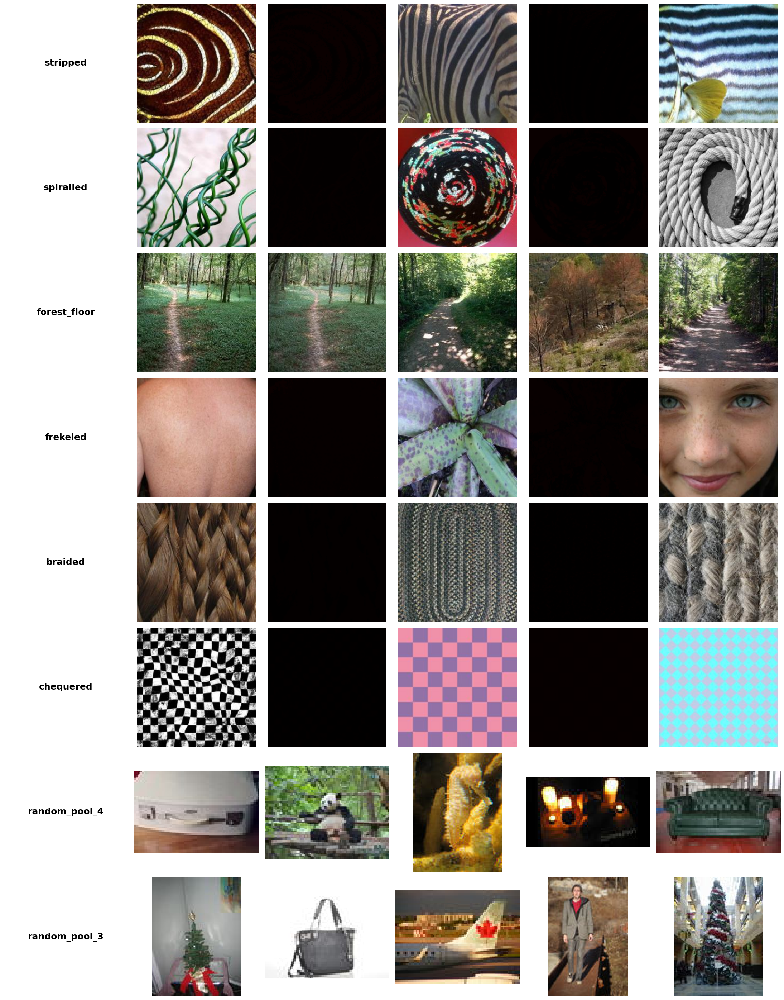

In [4]:
import glob

all_concepts = CONCEPTS + ['random_pool_4', 'random_pool_3']
n_figs = 5
n_concepts = len(all_concepts)

fig, axs = plt.subplots(n_concepts, n_figs + 1, figsize=(22, 3.5 * n_concepts))

for c, concept_name in enumerate(all_concepts):
    concept_path = os.path.join(CONCEPTS_DIR, concept_name)
    img_files = sorted(glob.glob(os.path.join(concept_path, '*')))

    for i in range(n_figs + 1):
        ax = axs[c][i]
        ax.axis('off')

        if i == 0:
            ax.text(0.5, 0.5, concept_name, ha='center', va='center',
                    fontsize=18, weight='bold')
        else:
            if i - 1 < len(img_files):
                img = plt.imread(img_files[i - 1])
                ax.imshow(img)
            else:
                ax.set_facecolor('lightgray')
                ax.text(0.5, 0.5, "No image", ha='center', va='center')

plt.tight_layout()
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

## 5. Prediction

Run the model on the Nautilus image to verify it predicts correctly (class 117: chambered nautilus).

In [5]:
# Create a local explainer for the Nautilus image
local_explainer = LocalVisualTCAV(
    test_image_filename='Gyromitra.jpg',
    m_steps=50,
    n_classes=3,
    target_class='gyromitra',
    model=vtcav_model,
    concept_images_dir=CONCEPTS_DIR,
    test_images_dir=TEST_IMAGES_DIR,
    random_images_folder='random_pool_4',
    cav_method=METHOD_CAV,
    device=DEVICE,
)

# Set concepts and layers
local_explainer.setConcepts(CONCEPTS)
local_explainer.setLayers(LAYERS)

# Run prediction
predictions = local_explainer.predict()
predictions.info(num_of_classes=5)


Model: GoogleNet
        Image       Class name Confidence
Gyromitra.jpg        gyromitra      10.75
                      mushroom       6.28
              hen-of-the-woods       5.59
                     stinkhorn       5.22
                  coral fungus       4.89


## 6. Run Visual-TCAV Explanation

Computes CAVs, concept maps, integrated gradients, and masked attributions for each (concept, layer) pair.

In [6]:
# Run the explanation pipeline
local_explainer.explain(cache_cav=True, cache_random=True)

# Print attribution results
for concept_name in local_explainer.concepts:
    for layer_name in local_explainer.layers:
        cl = local_explainer.computations[layer_name][concept_name]
        attribs = {k: v.item() if isinstance(v, torch.Tensor) else v
                   for k, v in cl.attributions.items()}
        print(f'{concept_name} @ {layer_name}: {attribs}')

Layers: 100%|██████████| 9/9 [00:11<00:00,  1.25s/it]

stripped @ inception3a: {0: 0.001308221137151122}
stripped @ inception3b: {0: 0.0}
stripped @ inception4a: {0: 0.0}
stripped @ inception4b: {0: 0.0}
stripped @ inception4c: {0: 0.0}
stripped @ inception4d: {0: 0.0005743785295635462}
stripped @ inception4e: {0: 0.0022210711613297462}
stripped @ inception5a: {0: 0.0006145022343844175}
stripped @ inception5b: {0: 0.0}
spiralled @ inception3a: {0: 0.00016583723481744528}
spiralled @ inception3b: {0: 0.0}
spiralled @ inception4a: {0: 7.106317934812978e-05}
spiralled @ inception4b: {0: 0.0}
spiralled @ inception4c: {0: 0.0}
spiralled @ inception4d: {0: 0.0002244458592031151}
spiralled @ inception4e: {0: 0.0030783526599407196}
spiralled @ inception5a: {0: 0.0008937186212278903}
spiralled @ inception5b: {0: 0.0}
forest_floor @ inception3a: {0: 0.043824613094329834}
forest_floor @ inception3b: {0: 0.028818592429161072}
forest_floor @ inception4a: {0: 0.06486603617668152}
forest_floor @ inception4b: {0: 0.06489918380975723}
forest_floor @ incept

## 7. Plot Concept Heatmaps

Visual-TCAV produces spatial concept maps overlaid on the original image, showing **where** each concept is detected. This is a key advantage over standard TCAV which only provides scalar scores.

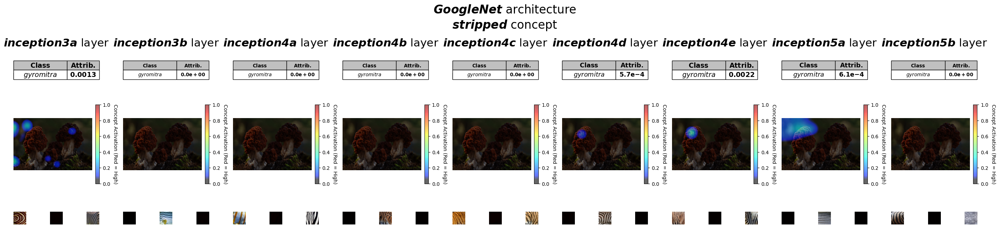

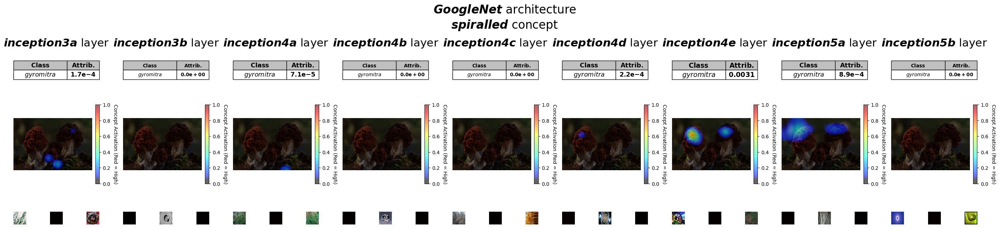

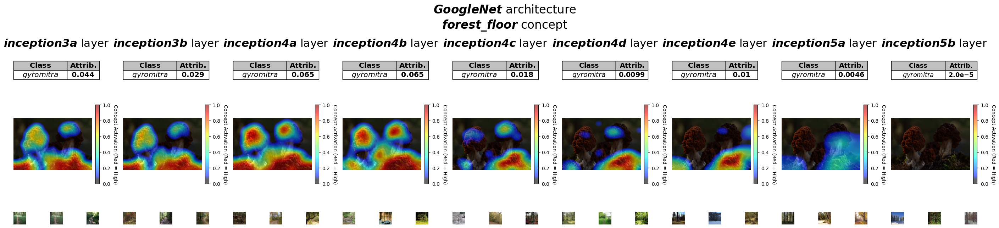

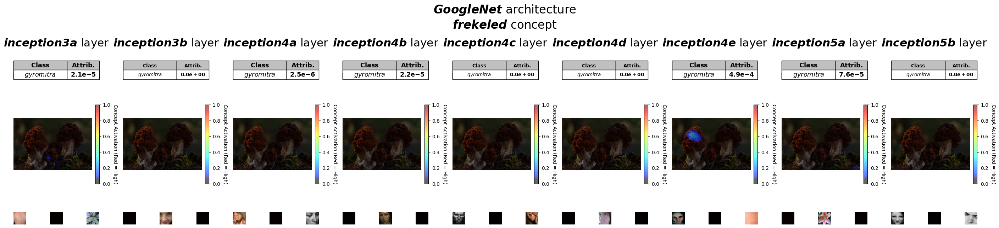

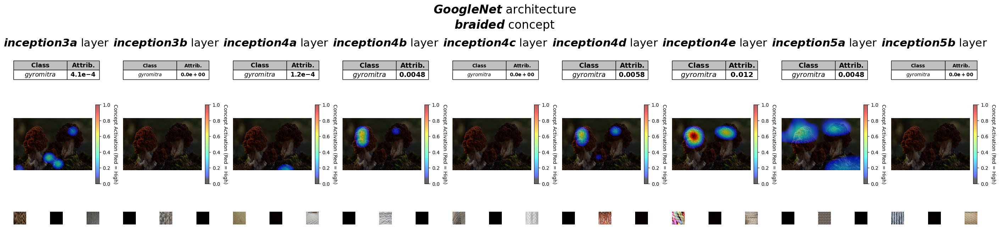

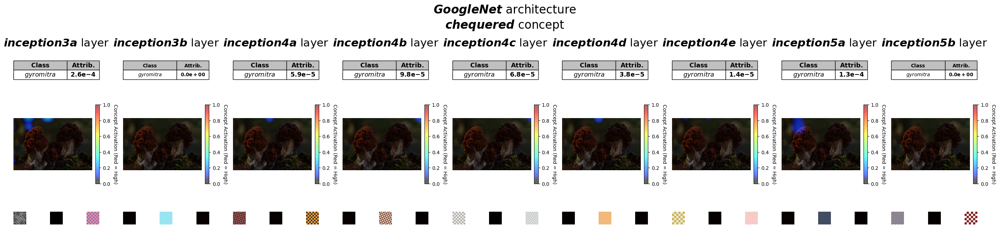

In [7]:
# Plot heatmaps and attribution tables for each concept
local_explainer.plot()

## 8. Inspect CAVs

Examine CAV directions and cosine similarities between concepts.

In [8]:
# Inspect CAVs at first layer
layer_name = LAYERS[0]

cavs = {}
for cn in CONCEPTS:
    cav = local_explainer.getCAVs(layer_name, cn)
    cavs[cn] = cav.direction
    print(f'{cn} @ {layer_name}: norm={cav.direction.norm():.4f}, '
          f'emblem=({cav.concept_emblem[0]:.4f}, {cav.concept_emblem[1]:.4f})')

# Cosine similarities between CAV directions
print(f'\nCosine similarities between CAV directions at {layer_name}:')
for a, b in combinations(CONCEPTS, 2):
    cos = F.cosine_similarity(
        cavs[a].unsqueeze(0), cavs[b].unsqueeze(0)
    ).item()
    print(f'  {a} vs {b}: {cos:.4f}')

stripped @ inception3a: norm=4.1467, emblem=(18.6270, 5.7109)
spiralled @ inception3a: norm=4.0615, emblem=(18.2970, 3.9187)
forest_floor @ inception3a: norm=4.1004, emblem=(8.2100, 0.0000)
frekeled @ inception3a: norm=3.9855, emblem=(18.7162, 4.3859)
braided @ inception3a: norm=3.9752, emblem=(12.6392, 2.9303)
chequered @ inception3a: norm=4.3505, emblem=(20.3549, 6.3554)

Cosine similarities between CAV directions at inception3a:
  stripped vs spiralled: 0.9400
  stripped vs forest_floor: 0.1240
  stripped vs frekeled: 0.8939
  stripped vs braided: 0.9133
  stripped vs chequered: 0.9074
  spiralled vs forest_floor: 0.2746
  spiralled vs frekeled: 0.9575
  spiralled vs braided: 0.9848
  spiralled vs chequered: 0.9103
  forest_floor vs frekeled: 0.1986
  forest_floor vs braided: 0.3166
  forest_floor vs chequered: 0.1146
  frekeled vs braided: 0.9655
  frekeled vs chequered: 0.8682
  braided vs chequered: 0.8879


## 9. Experiment with Classifier-based CAVs

Compare centroid-based CAVs (Visual-TCAV original) with classifier-based CAVs (standard TCAV, Kim et al. 2018).

In [9]:
# Local explanation with classifier-based CAVs
local_clf = LocalVisualTCAV(
    test_image_filename='Gyromitra.jpg',
    m_steps=50,
    n_classes=3,
    target_class='gyromitra',
    model=vtcav_model,
    concept_images_dir=CONCEPTS_DIR,
    test_images_dir=TEST_IMAGES_DIR,
    random_images_folder='random_pool_4',
    cav_method='classifier',
    device=DEVICE,
)

local_clf.setConcepts(CONCEPTS)
local_clf.setLayers(LAYERS)

predictions_clf = local_clf.predict()
local_clf.explain(cache_cav=False, cache_random=True)

print('=== Classifier-based CAVs ===')
for concept_name in CONCEPTS:
    for layer_name in LAYERS:
        cav = local_clf.getCAVs(layer_name, concept_name)
        attribs = local_clf.computations[layer_name][concept_name].attributions
        attribs = {k: v.item() if isinstance(v, torch.Tensor) else v for k, v in attribs.items()}
        print(f'{concept_name} @ {layer_name}: accuracy={cav.accuracy:.3f}, attribs={attribs}')

Layers: 100%|██████████| 9/9 [00:26<00:00,  2.95s/it]

=== Classifier-based CAVs ===
stripped @ inception3a: accuracy=0.986, attribs={0: 0.051416702568531036}
stripped @ inception3b: accuracy=0.993, attribs={0: 0.030151693150401115}
stripped @ inception4a: accuracy=1.000, attribs={0: 0.004049462731927633}
stripped @ inception4b: accuracy=1.000, attribs={0: 0.000574692094232887}
stripped @ inception4c: accuracy=1.000, attribs={0: 0.0004145221901126206}
stripped @ inception4d: accuracy=1.000, attribs={0: 0.0005581407458521426}
stripped @ inception4e: accuracy=1.000, attribs={0: 3.7674126360798255e-05}
stripped @ inception5a: accuracy=1.000, attribs={0: 0.0003632399602793157}
stripped @ inception5b: accuracy=1.000, attribs={0: 0.0008098676335066557}
spiralled @ inception3a: accuracy=1.000, attribs={0: 0.16975894570350647}
spiralled @ inception3b: accuracy=1.000, attribs={0: 0.0}
spiralled @ inception4a: accuracy=1.000, attribs={0: 0.04699517786502838}
spiralled @ inception4b: accuracy=1.000, attribs={0: 0.04621071368455887}
spiralled @ incept

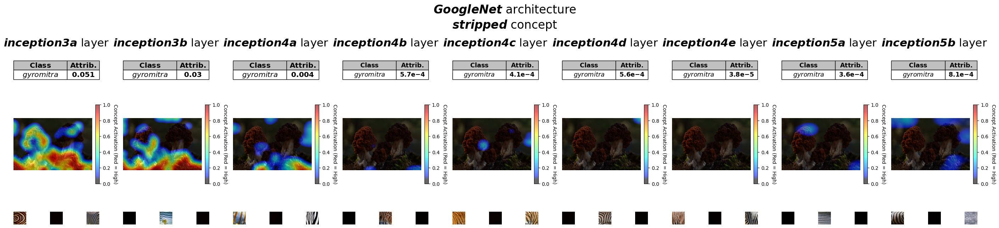

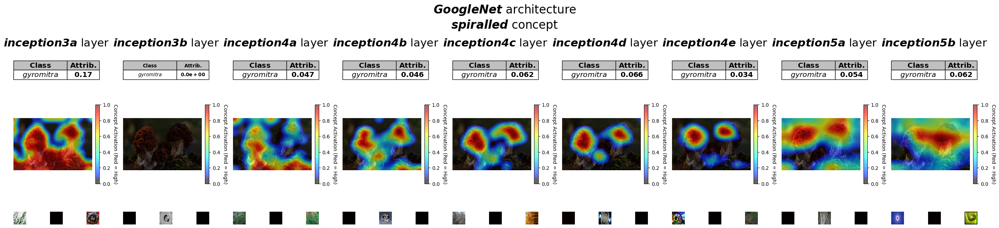

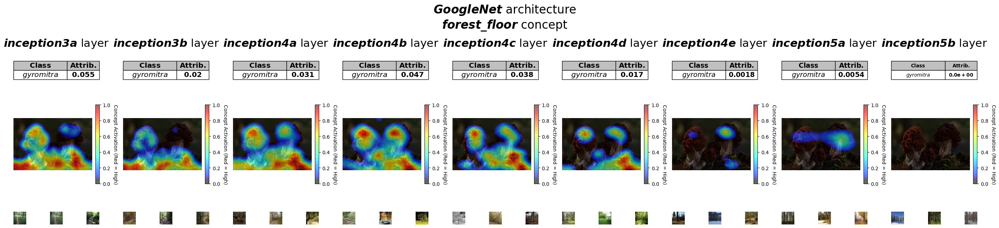

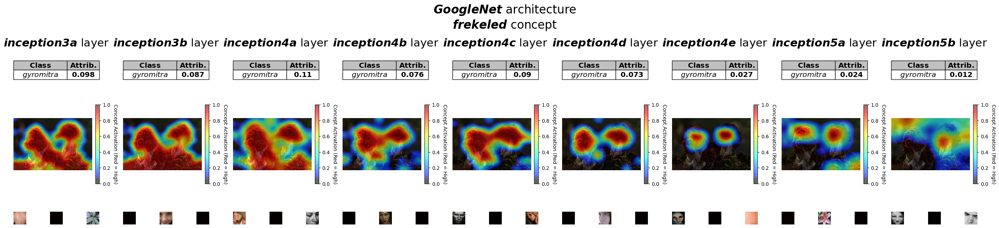

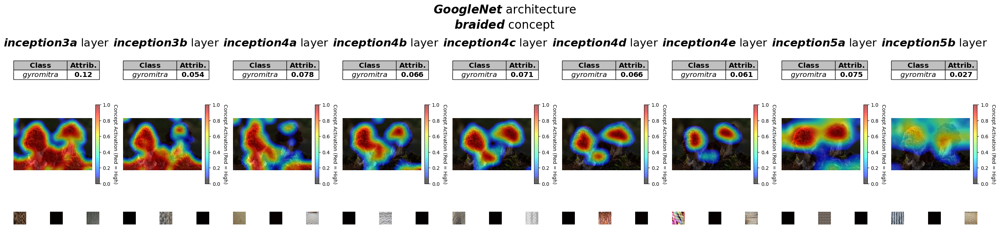

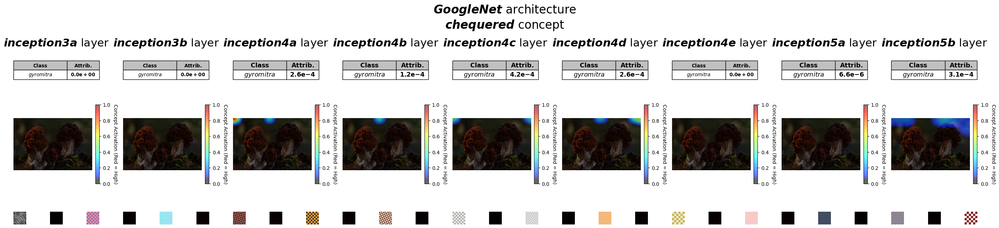

In [10]:
# Plot classifier-based heatmaps for comparison
local_clf.plot()

## 10. Compare Centroid vs Classifier CAV Directions

In [11]:
# Compare CAV directions between centroid and classifier methods
print('Cosine similarity between centroid and classifier CAV directions:')
for cn in CONCEPTS:
    for layer_name in LAYERS:
        d_centroid = local_explainer.getCAVs(layer_name, cn).direction
        d_classifier = local_clf.getCAVs(layer_name, cn).direction
        cos = F.cosine_similarity(
            d_centroid.unsqueeze(0), d_classifier.unsqueeze(0)
        ).item()
        print(f'  {cn} @ {layer_name}: {cos:.4f}')

Cosine similarity between centroid and classifier CAV directions:
  stripped @ inception3a: 0.3792
  stripped @ inception3b: 0.4618
  stripped @ inception4a: 0.5342
  stripped @ inception4b: 0.6185
  stripped @ inception4c: 0.6515
  stripped @ inception4d: 0.6883
  stripped @ inception4e: 0.7445
  stripped @ inception5a: 0.7411
  stripped @ inception5b: 0.6884
  spiralled @ inception3a: 0.3651
  spiralled @ inception3b: 0.4191
  spiralled @ inception4a: 0.5477
  spiralled @ inception4b: 0.6498
  spiralled @ inception4c: 0.6762
  spiralled @ inception4d: 0.6663
  spiralled @ inception4e: 0.6335
  spiralled @ inception5a: 0.6735
  spiralled @ inception5b: 0.6204
  forest_floor @ inception3a: 0.7875
  forest_floor @ inception3b: 0.8147
  forest_floor @ inception4a: 0.7915
  forest_floor @ inception4b: 0.7431
  forest_floor @ inception4c: 0.6705
  forest_floor @ inception4d: 0.6532
  forest_floor @ inception4e: 0.6287
  forest_floor @ inception5a: 0.7460
  forest_floor @ inception5b: 0.744

## 11. Experiment with different random baselines

Same as the original notebook's experiment with `random_0` and `random_1` to check robustness.

In [12]:
# Run with random_1 as baseline to check consistency
local_r1 = LocalVisualTCAV(
    test_image_filename='Gyromitra.jpg',
    m_steps=50,
    n_classes=3,
    target_class='gyromitra',
    model=vtcav_model,
    concept_images_dir=CONCEPTS_DIR,
    test_images_dir=TEST_IMAGES_DIR,
    random_images_folder='random_pool_4',
    cav_method=METHOD_CAV,
    device=DEVICE,
)

local_r1.setConcepts(CONCEPTS)
local_r1.setLayers(LAYERS)
predictions_r1 = local_r1.predict()
local_r1.explain(cache_cav=True, cache_random=True)

print('=== random_0 baseline (from section 6) ===')
for cn in CONCEPTS:
    attribs = {layer: local_explainer.computations[layer][cn].attributions[0].item()
               if isinstance(local_explainer.computations[layer][cn].attributions[0], torch.Tensor)
               else local_explainer.computations[layer][cn].attributions[0]
               for layer in LAYERS}
    print(f'  {cn}: {attribs}')

print('\n=== random_1 baseline ===')
for cn in CONCEPTS:
    attribs = {layer: local_r1.computations[layer][cn].attributions[0].item()
               if isinstance(local_r1.computations[layer][cn].attributions[0], torch.Tensor)
               else local_r1.computations[layer][cn].attributions[0]
               for layer in LAYERS}
    print(f'  {cn}: {attribs}')

Layers: 100%|██████████| 9/9 [00:09<00:00,  1.11s/it]

=== random_0 baseline (from section 6) ===
  stripped: {'inception3a': 0.001308221137151122, 'inception3b': 0.0, 'inception4a': 0.0, 'inception4b': 0.0, 'inception4c': 0.0, 'inception4d': 0.0005743785295635462, 'inception4e': 0.0022210711613297462, 'inception5a': 0.0006145022343844175, 'inception5b': 0.0}
  spiralled: {'inception3a': 0.00016583723481744528, 'inception3b': 0.0, 'inception4a': 7.106317934812978e-05, 'inception4b': 0.0, 'inception4c': 0.0, 'inception4d': 0.0002244458592031151, 'inception4e': 0.0030783526599407196, 'inception5a': 0.0008937186212278903, 'inception5b': 0.0}
  forest_floor: {'inception3a': 0.043824613094329834, 'inception3b': 0.028818592429161072, 'inception4a': 0.06486603617668152, 'inception4b': 0.06489918380975723, 'inception4c': 0.01848096214234829, 'inception4d': 0.00989651307463646, 'inception4e': 0.010405350476503372, 'inception5a': 0.0046030934900045395, 'inception5b': 2.0145715097896755e-05}
  frekeled: {'inception3a': 2.147062696167268e-05, 'incepti

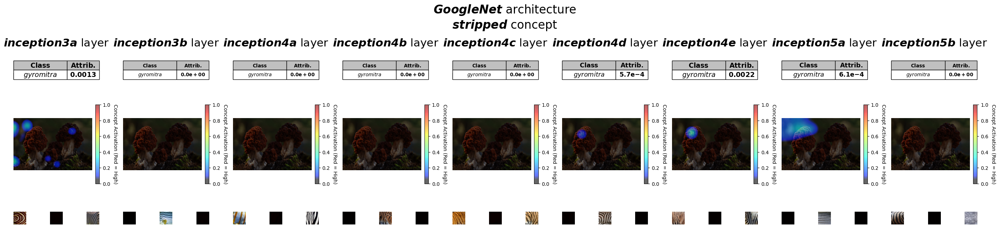

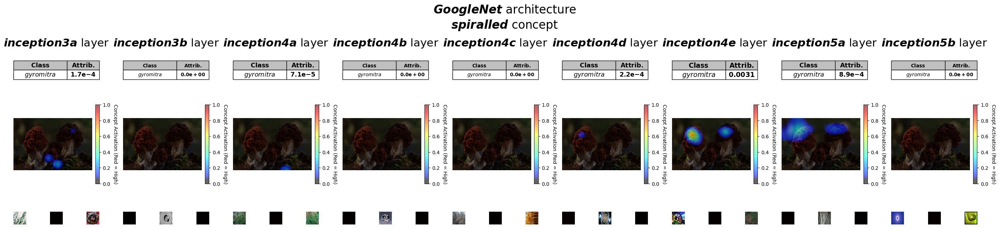

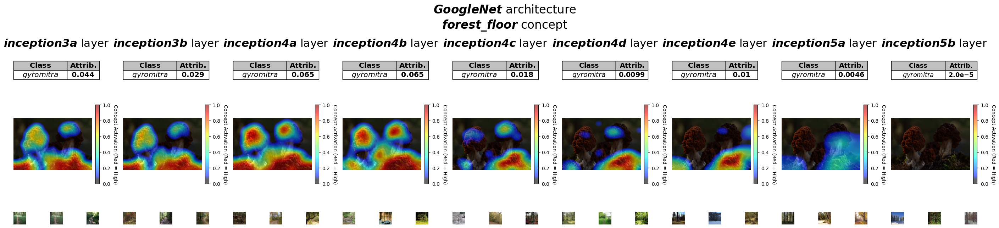

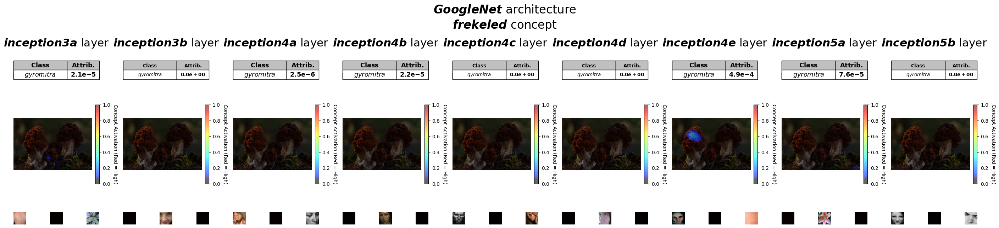

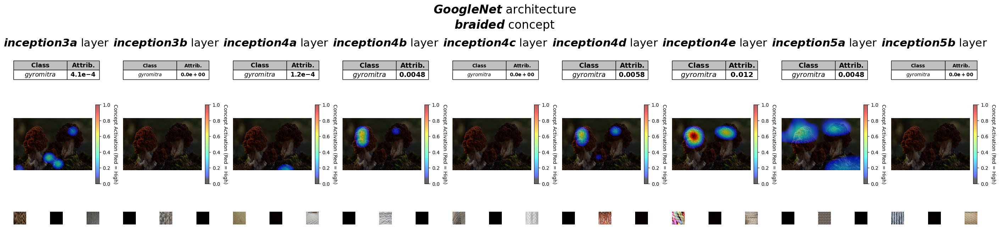

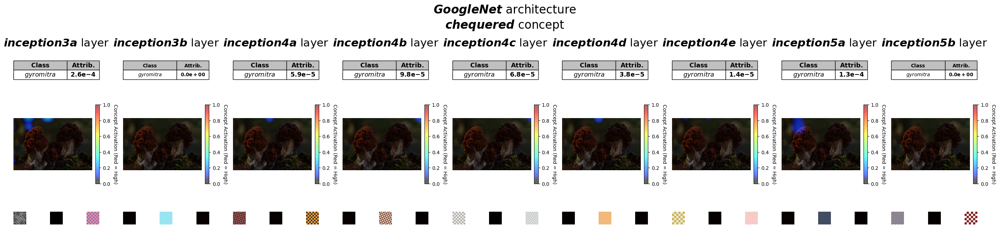

In [13]:
# Plot heatmaps with random_1 baseline
local_r1.plot()

## 12. Summary

This notebook applied **Visual-TCAV** to GoogleNet on a Nautilus image, replicating the same experiment as `tcav_googlenet_local.ipynb` but with the `VisualTCAV_pytorch` library.

**What Visual-TCAV adds over standard TCAV:**
- **Spatial concept maps**: heatmaps showing *where* in the image each concept is detected
- **Per-class masked attributions**: concept attributions weighted by spatial relevance
- **Two CAV methods**: centroid-based (original) and classifier-based (standard TCAV)

| Concept | Expected relevance to Nautilus |
|---------|------------------------------|
| stripped | High (nautilus shell has spiral stripes) |
| spiralled | High (nautilus shell is spiral-shaped) |
| frekeled | Low (no freckle-like patterns) |
| braided | Low (no braided patterns) |
| chequered | Low (no checkerboard patterns) |